In [1]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 99.7 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 25.4 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.4 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: n

In [2]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 19.2 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

2025-11-20 09:55:56.806177: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763632556.993056      48 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763632557.045737      48 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [4]:
dataset_path_rgn = "/kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-0.9877, -1.0048, -1.1418,  ..., -2.1179, -2.0152, -1.9809],
         [-1.0048, -1.1075, -0.9705,  ..., -1.9980, -2.0837, -2.0837],
         [-1.0562, -0.9534, -0.8678,  ..., -2.1179, -2.0494, -1.9467],
         ...,
         [-0.7993, -0.9192, -0.7479,  ..., -1.6384, -1.5528, -1.6727],
         [-0.3027, -0.3712, -0.5938,  ..., -1.8097, -1.6042, -1.5014],
         [-0.1828, -0.3712, -0.2684,  ..., -1.8439, -2.1179, -2.0494]],

        [[-1.2479, -1.2654, -1.1078,  ..., -1.4930, -1.5805, -1.7381],
         [-1.3354, -1.1954, -1.0553,  ..., -1.6155, -1.7031, -1.4405],
         [-1.1779, -1.1604, -1.1429,  ..., -1.7906, -1.8431, -1.5630],
         ...,
         [-0.8102, -0.6877, -0.4426,  ..., -1.3880, -1.3179, -1.3004],
         [-0.0049, -0.1800, -0.3025,  ..., -1.5455, -1.3179, -1.5455],
         [-0.0574, -0.2675, -0.1625,  ..., -1.4580, -1.8081, -1.8256]],

        [[-0.9853, -1.0027, -1.0027,  ..., -1.6650, -1.5779, -1.6476],
         [-1.1247, -0.9853, -0.9853,  ..., -1

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        ...,
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [21]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3, self).__init__()
        self.base_model = smp.DeepLabV3(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

In [23]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [24]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [25]:
!pip install optuna

In [26]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [27]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [28]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.5, 0.5)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-20 09:56:38,867] A new study created in memory with name: no-name-8ff1dc54-a3ec-4c58-ba76-82e4997d87a5


Trial 0: scheduler = cosine, dice weight = 0.5, focal weight = 0.5



100%|██████████| 18/18 [00:14<00:00,  1.21it/s]


Epoch 1/25:
Train loss: 0.2551987005604638, Train Avg IoU: 0.4756430402579927



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.21423267324765524, Val Avg IoU: 0.5808484500316468



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 2/25:
Train loss: 0.2254210321439637, Train Avg IoU: 0.5714547465241776



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.1851741224527359, Val Avg IoU: 0.6636209277004913



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 3/25:
Train loss: 0.20124517132838568, Train Avg IoU: 0.665665341509406



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.1682466814915339, Val Avg IoU: 0.7351000394698547



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 4/25:
Train loss: 0.18186017291413414, Train Avg IoU: 0.7209109587892072



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.16746607919534048, Val Avg IoU: 0.74934130543657



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 5/25:
Train loss: 0.17677869730525547, Train Avg IoU: 0.7407000697962017



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.14672324061393738, Val Avg IoU: 0.8106561960890698



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 6/25:
Train loss: 0.17755605777104697, Train Avg IoU: 0.718727460322956



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.15287101765473685, Val Avg IoU: 0.771656709917611



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 7/25:
Train loss: 0.1701857621471087, Train Avg IoU: 0.7468741811147973



100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


Val loss: 0.13920735319455466, Val Avg IoU: 0.824725097166949



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 8/25:
Train loss: 0.16370323383145863, Train Avg IoU: 0.7675445983521421



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.1409389724334081, Val Avg IoU: 0.8085197039481867



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 9/25:
Train loss: 0.15782211307022306, Train Avg IoU: 0.7749785330502327



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.13539560635884604, Val Avg IoU: 0.8254842548797597



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 10/25:
Train loss: 0.1581942563255628, Train Avg IoU: 0.7717623003609623



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.13557472825050354, Val Avg IoU: 0.8197480875736156



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 11/25:
Train loss: 0.15178072038624021, Train Avg IoU: 0.8000553329704877



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.13188918679952621, Val Avg IoU: 0.8271359692571177



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 12/25:
Train loss: 0.14860029601388508, Train Avg IoU: 0.7966448865706832



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.12869842847188315, Val Avg IoU: 0.8319879728008047



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 13/25:
Train loss: 0.14992873701784346, Train Avg IoU: 0.7985104769981097



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.12993289033571878, Val Avg IoU: 0.8235696522451406



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 14/25:
Train loss: 0.14336156886484888, Train Avg IoU: 0.8095436605836622



100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


Val loss: 0.12531293680270514, Val Avg IoU: 0.8398575824876922



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 15/25:
Train loss: 0.14328755935033163, Train Avg IoU: 0.8163561629345785



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.12515649944543839, Val Avg IoU: 0.8352783331883301



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 16/25:
Train loss: 0.14236130399836433, Train Avg IoU: 0.8138664625937477



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.12427203605572383, Val Avg IoU: 0.8350088668631493



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 17/25:
Train loss: 0.1397523610956139, Train Avg IoU: 0.8194801616121661



100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


Val loss: 0.12527805070082346, Val Avg IoU: 0.8274536657300283



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 18/25:
Train loss: 0.13825540492932, Train Avg IoU: 0.8129253414174018



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.12210669368505478, Val Avg IoU: 0.8389792677425895



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 19/25:
Train loss: 0.1394817791879177, Train Avg IoU: 0.8212321428114936



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.12086749821901321, Val Avg IoU: 0.843503317621369



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 20/25:
Train loss: 0.13707967888977793, Train Avg IoU: 0.8129963549671791



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.12105028331279755, Val Avg IoU: 0.8407655615441052



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 21/25:
Train loss: 0.13886737864878443, Train Avg IoU: 0.8243018098080469



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.12043024847904842, Val Avg IoU: 0.8442621084836048



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 22/25:
Train loss: 0.13772830532656777, Train Avg IoU: 0.823962507275262



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.12066417435805003, Val Avg IoU: 0.8439576448674041



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 23/25:
Train loss: 0.13553916290402412, Train Avg IoU: 0.8301584381690743



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.12060675770044327, Val Avg IoU: 0.8436560281803313



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 24/25:
Train loss: 0.13671321877174908, Train Avg IoU: 0.8243916168500764



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.12040097763140996, Val Avg IoU: 0.843827144538326



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 25/25:
Train loss: 0.13516921384467018, Train Avg IoU: 0.8301672551112788



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]
[I 2025-11-20 10:02:53,091] Trial 0 finished with value: 0.1203734924395879 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.5, 0.5)}. Best is trial 0 with value: 0.1203734924395879.


Val loss: 0.1203734924395879, Val Avg IoU: 0.843948745784381

Trial 1: scheduler = reducelr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 1/25:
Train loss: 0.25419895185364616, Train Avg IoU: 0.4789486211784629



100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


Val loss: 0.22002925475438437, Val Avg IoU: 0.5826619466158934



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 2/25:
Train loss: 0.230198016597165, Train Avg IoU: 0.5416951941209075



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.1904937078555425, Val Avg IoU: 0.6546717033165667



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 3/25:
Train loss: 0.2019229589237107, Train Avg IoU: 0.6521551861360132



100%|██████████| 3/3 [00:00<00:00,  3.10it/s]


Val loss: 0.1692792922258377, Val Avg IoU: 0.7443458890693014



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 4/25:
Train loss: 0.18710433526171577, Train Avg IoU: 0.7242940490196085



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]


Val loss: 0.16459828118483225, Val Avg IoU: 0.7334792695097233



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 5/25:
Train loss: 0.17393659551938376, Train Avg IoU: 0.7497446755570795



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.14419328918059668, Val Avg IoU: 0.816840761268678



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 6/25:
Train loss: 0.1690058492951923, Train Avg IoU: 0.7563208832100768



100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


Val loss: 0.14742998778820038, Val Avg IoU: 0.7885440817336778



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 7/25:
Train loss: 0.1692976810865932, Train Avg IoU: 0.739870210468046



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.14620556433995566, Val Avg IoU: 0.7909609411435022



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 8/25:
Train loss: 0.16533772067891228, Train Avg IoU: 0.7528100634142653



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.1363480438788732, Val Avg IoU: 0.8273071906595941



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 9/25:
Train loss: 0.15620104471842447, Train Avg IoU: 0.7942662563562941



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]


Val loss: 0.13525768866141638, Val Avg IoU: 0.8186280392559407



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 10/25:
Train loss: 0.14944439588321579, Train Avg IoU: 0.7952943970420678



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.1392503504951795, Val Avg IoU: 0.791412777385666



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 11/25:
Train loss: 0.15362472873595026, Train Avg IoU: 0.7817193745370276



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.1292466719945272, Val Avg IoU: 0.8320876056823588



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 12/25:
Train loss: 0.15103373262617323, Train Avg IoU: 0.7752774465765333



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.1373853087425232, Val Avg IoU: 0.7946229744388216



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 13/25:
Train loss: 0.14589584494630495, Train Avg IoU: 0.7989706812362352



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.12441515177488327, Val Avg IoU: 0.8356879975675855



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 14/25:
Train loss: 0.14174326467845175, Train Avg IoU: 0.8106397092331052



100%|██████████| 3/3 [00:01<00:00,  2.75it/s]


Val loss: 0.12245790660381317, Val Avg IoU: 0.8370561515577927



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 15/25:
Train loss: 0.13961649561921755, Train Avg IoU: 0.8104976841433844



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.12465367217858632, Val Avg IoU: 0.8273309748237446



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 16/25:
Train loss: 0.13733230200078753, Train Avg IoU: 0.814126416455788



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.12292959541082382, Val Avg IoU: 0.8228377778905073



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 17/25:
Train loss: 0.13762150580684343, Train Avg IoU: 0.8095937608432853



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.11871811747550964, Val Avg IoU: 0.8371929102138402



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 18/25:
Train loss: 0.13441144302487373, Train Avg IoU: 0.8201257476190884



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.11580792566140492, Val Avg IoU: 0.8394061936721657



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 19/25:
Train loss: 0.13638432986206478, Train Avg IoU: 0.7946502369299808



100%|██████████| 3/3 [00:01<00:00,  2.93it/s]


Val loss: 0.12554314732551575, Val Avg IoU: 0.7990902850960437



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 20/25:
Train loss: 0.1353521305653784, Train Avg IoU: 0.7998535942779106



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.11430460462967555, Val Avg IoU: 0.8359561340327946



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 21/25:
Train loss: 0.12808822550707394, Train Avg IoU: 0.8177663599293931



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.11543968816598256, Val Avg IoU: 0.8333870583680278



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 22/25:
Train loss: 0.12630194591151345, Train Avg IoU: 0.8204595260836718



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]


Val loss: 0.10914694269498189, Val Avg IoU: 0.848139007019607



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 23/25:
Train loss: 0.12401912402775553, Train Avg IoU: 0.8222383057076513



100%|██████████| 3/3 [00:01<00:00,  2.94it/s]


Val loss: 0.11254485944906871, Val Avg IoU: 0.8326444664503265



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 24/25:
Train loss: 0.12098108852903049, Train Avg IoU: 0.8286868401256805



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.10750367492437363, Val Avg IoU: 0.8463199744000859



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 25/25:
Train loss: 0.12293056522806485, Train Avg IoU: 0.8279633030509724



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]
[I 2025-11-20 10:09:08,299] Trial 1 finished with value: 0.10513357569773991 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}. Best is trial 1 with value: 0.10513357569773991.


Val loss: 0.10513357569773991, Val Avg IoU: 0.8489591847590207

Trial 2: scheduler = steplr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 1/25:
Train loss: 0.2542682844731543, Train Avg IoU: 0.4770376718448911



100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


Val loss: 0.21399608751138052, Val Avg IoU: 0.5596610606888348



100%|██████████| 18/18 [00:14<00:00,  1.28it/s]


Epoch 2/25:
Train loss: 0.22573764125506082, Train Avg IoU: 0.5788616111692472



100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


Val loss: 0.18726351857185364, Val Avg IoU: 0.6709639263811608



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 3/25:
Train loss: 0.20301024946901533, Train Avg IoU: 0.6595882403554246



100%|██████████| 3/3 [00:01<00:00,  2.92it/s]


Val loss: 0.1746040185292562, Val Avg IoU: 0.733382104644665



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 4/25:
Train loss: 0.1889012803634008, Train Avg IoU: 0.7248409502842733



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.16605773071448007, Val Avg IoU: 0.7498629197158828



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 5/25:
Train loss: 0.1783546283841133, Train Avg IoU: 0.7258251554446062



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.15204889078934988, Val Avg IoU: 0.7989905561319491



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 6/25:
Train loss: 0.16975234614478218, Train Avg IoU: 0.7719659375342165



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.1479638268550237, Val Avg IoU: 0.8099200384076836



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 7/25:
Train loss: 0.16184853431251314, Train Avg IoU: 0.7877291620905742



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.145139550169309, Val Avg IoU: 0.8112027858107584



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 8/25:
Train loss: 0.15917850451336968, Train Avg IoU: 0.790097191897603



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.1410739521185557, Val Avg IoU: 0.825965925194376



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 9/25:
Train loss: 0.15697697467274135, Train Avg IoU: 0.8042603554462865



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.13961277653773627, Val Avg IoU: 0.8238471080222446



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 10/25:
Train loss: 0.1576930441790157, Train Avg IoU: 0.7970135833145492



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.13689022759596506, Val Avg IoU: 0.8297593414997313



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 11/25:
Train loss: 0.1542181662387318, Train Avg IoU: 0.8060195524383712



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.1357914979259173, Val Avg IoU: 0.8326950378955885



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 12/25:
Train loss: 0.15171762473053402, Train Avg IoU: 0.8063661925563537



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.13876973589261374, Val Avg IoU: 0.8193015770022362



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 13/25:
Train loss: 0.15098650587929618, Train Avg IoU: 0.8044591065702701



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.13617118696371713, Val Avg IoU: 0.8232103651448052



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 14/25:
Train loss: 0.14927941974666384, Train Avg IoU: 0.8066862073674289



100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


Val loss: 0.13797365377346674, Val Avg IoU: 0.8200151887662009



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 15/25:
Train loss: 0.1466923997633987, Train Avg IoU: 0.814988695973107



100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


Val loss: 0.13268481443325678, Val Avg IoU: 0.8362344101180281



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 16/25:
Train loss: 0.1473889114956061, Train Avg IoU: 0.8130808830287977



100%|██████████| 3/3 [00:01<00:00,  2.87it/s]


Val loss: 0.1325486128528913, Val Avg IoU: 0.8341945149230847



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 17/25:
Train loss: 0.14701777448256811, Train Avg IoU: 0.8152481111427613



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.13189753890037537, Val Avg IoU: 0.8360956131067153



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 18/25:
Train loss: 0.1464540825949775, Train Avg IoU: 0.8156764014746164



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.1313976893822352, Val Avg IoU: 0.8378620964191614



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 19/25:
Train loss: 0.14788870761791864, Train Avg IoU: 0.8174566584031014



100%|██████████| 3/3 [00:01<00:00,  2.93it/s]


Val loss: 0.13110568126042685, Val Avg IoU: 0.8372618468614387



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 20/25:
Train loss: 0.14527928291095626, Train Avg IoU: 0.8244462746235588



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.1310920094450315, Val Avg IoU: 0.8366028566848965



100%|██████████| 18/18 [00:14<00:00,  1.29it/s]


Epoch 21/25:
Train loss: 0.14658206204573312, Train Avg IoU: 0.8167577968600036



100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


Val loss: 0.1311090886592865, Val Avg IoU: 0.8378688581082921



100%|██████████| 18/18 [00:14<00:00,  1.28it/s]


Epoch 22/25:
Train loss: 0.141701710720857, Train Avg IoU: 0.8258199690108908



100%|██████████| 3/3 [00:01<00:00,  2.89it/s]


Val loss: 0.13056077808141708, Val Avg IoU: 0.8382973565176854



100%|██████████| 18/18 [00:14<00:00,  1.28it/s]


Epoch 23/25:
Train loss: 0.1447605834239059, Train Avg IoU: 0.8256053437342066



100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


Val loss: 0.13094093402226767, Val Avg IoU: 0.8373547785485039



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 24/25:
Train loss: 0.1444883851541413, Train Avg IoU: 0.8239468914300648



100%|██████████| 3/3 [00:01<00:00,  2.91it/s]


Val loss: 0.13007909059524536, Val Avg IoU: 0.839636529592621



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 25/25:
Train loss: 0.14592110365629196, Train Avg IoU: 0.8200629337699027



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]
[I 2025-11-20 10:15:24,466] Trial 2 finished with value: 0.12981233497460684 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.5, 0.5)}. Best is trial 1 with value: 0.10513357569773991.


Val loss: 0.12981233497460684, Val Avg IoU: 0.8395754361649773



In [29]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}
Best val loss: 0.10513357569773991


In [30]:
fine_tune_model.eval()

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

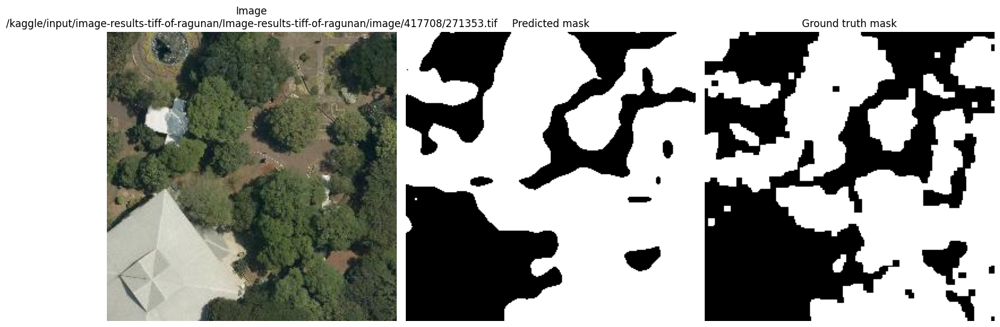

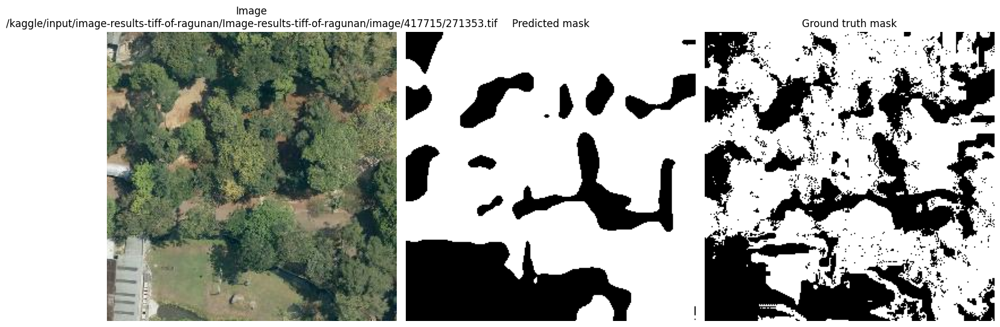

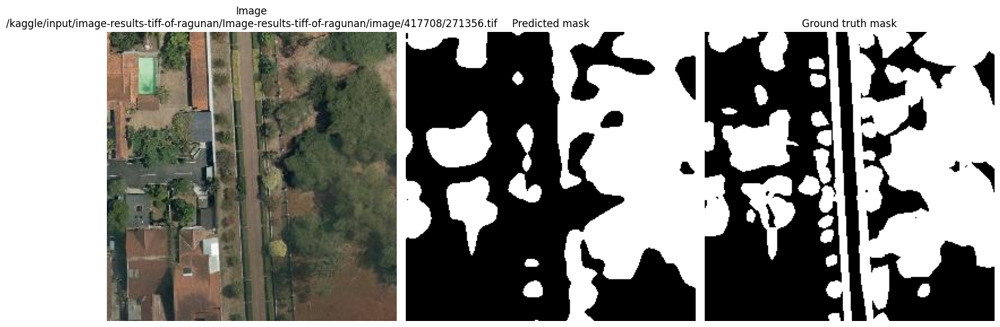

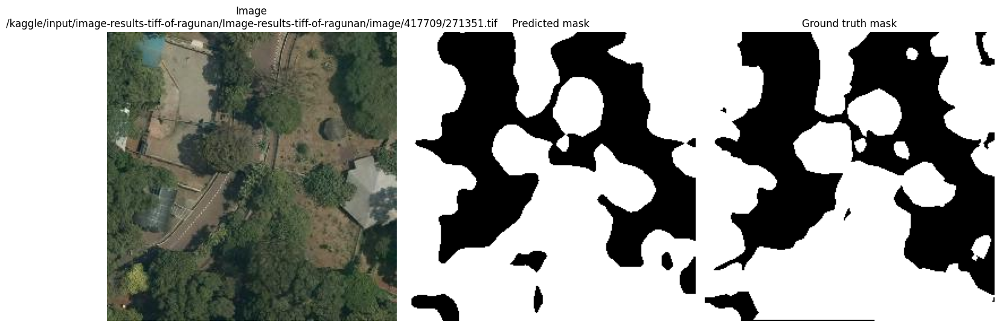

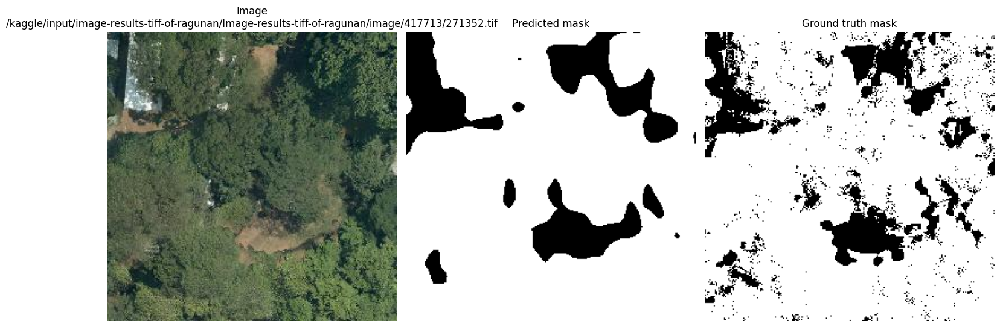

...

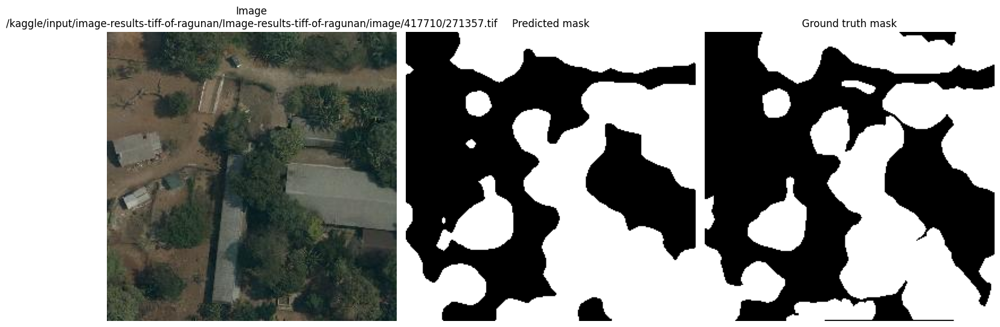

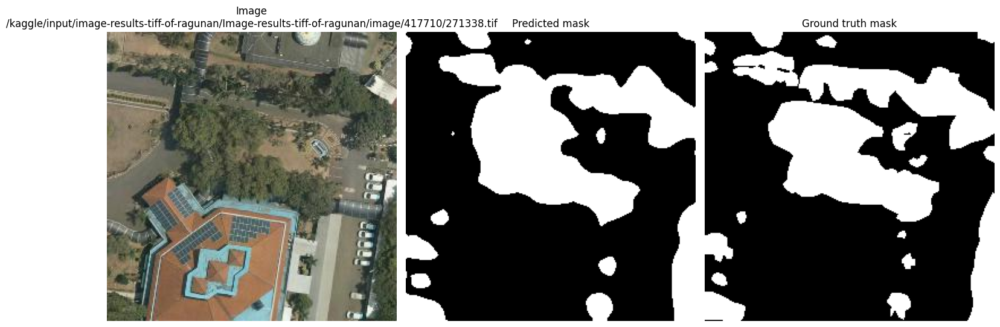

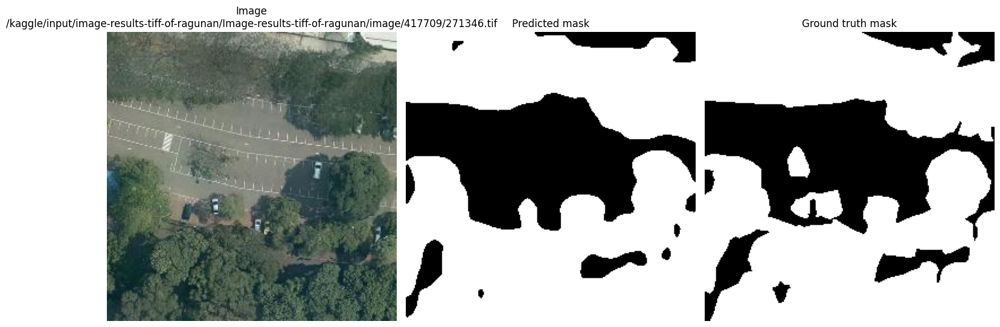

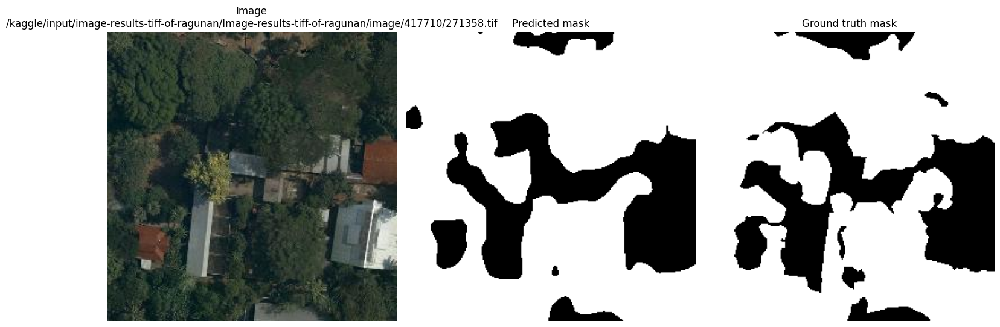

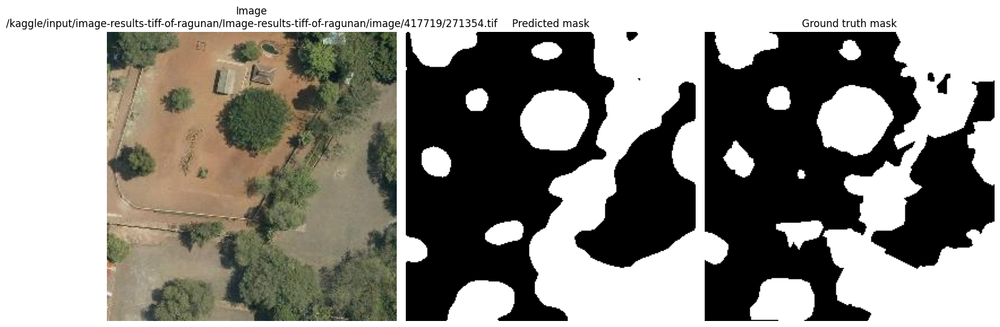

In [31]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [32]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [33]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41430
Vegetation coverage area: 23318.043293515642
IoU score: 0.8080166256598906
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 45948
Vegetation coverage area: 3570.52395763541
IoU score: 0.7408123791102514
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 28531
Vegetation coverage area: 16058.10024637448
IoU score: 0.7226185360263573
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40945
Vegetation coverage area: 23045.070785734926
IoU score: 0.8551986296548326
Image /kaggle/input/ima

In [36]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 23318.043293515642 m^2
Carbon density: 0.007079938070213614 ton/m^2
Estimated carbon stock: 165.09030243665063 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3570.52395763541 m^2
Carbon density: 0.007079938070213614 ton/m^2
Estimated carbon stock: 25.27908849827272 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 16058.10024637448 m^2
Carbon density: 0.007079938070213614 ton/m^2
Estimated carbon stock: 113.69035526961329 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 23045.070785734926 m^2
Carbon density: 0.007079938070213614 ton/m^2
Estimated carbon stock: 163.15767398669226 ton
Image /kaggle/input/imag